## Introduction to Simple Linear Regression
    

<center>
<img src="https://etzq49yfnmd.exactdn.com/wp-content/uploads/2022/03/image021.png?strip=all&lossy=1&w=776&ssl=1"
 width=500>
</center>

Source: [The Discovery of Statistical Regression](https://priceonomics.com/the-discovery-of-statistical-regression/)

### Last class:

- A/B testing is used to compare two variations of a product or a service: control (A) and variation (B)

- It is founded in principles of classical Hypothesis Testing and Inference

- One may be tempted to peek at results of A/B tests as data are being collected

- Early peeking and stopping must be planned and designed. 

- Using unadjusted quantities can drastically inflate the type I error rate

### High-level goals of this course related to week 3:

- Distinguish between generative models (GM) and predictive models (PM):

    - GM: to understand the data-generating mechanism 
    - PM: to make out-of-sample predictions using the estimated model

- Distinguish between model-based methods from non-model based methods

## Generative models

As data scientists, we are often interested in understanding the relationship between variables in our data using *models*. For example:

- which variables are associated with a response of interest? 

- can we model the relationship between the response and the input variables? Is a linear model adequate?

- which variables are positively/negatively associated with the response? 

- does the relationship between the response and an input variable depend on the values of the other variables?

**Linear regression models can be used to answer these questions**


## Historical throwback ...

**Historical note I**: Least squares (a classical method in Regression) was first used by **Legendre** (1805) and by **Gauss** (1809) to estimate the orbits of comets based on measurements of the comets’ previous locations. 

Gauss even predicted the appearence of the asteroid Ceres using LS combined with other complex computations (Source: [The Discovery of Statistical Regression](https://priceonomics.com/the-discovery-of-statistical-regression/))

    
<center>
<img src="https://etzq49yfnmd.exactdn.com/wp-content/uploads/2022/03/image021.png?strip=all&lossy=1&w=776&ssl=1"
 width=500>
</center>


**Historical note II**: 

<table><tr>
<td> <img src="https://github.com/UBC-STAT/stat-301/blob/master/supplementary-material/img/galton_pearson.png?raw=true" style="width:3000px;"/> </td>
<td> However, neither Legendre or Gauss coined the term "Regression". Francis Galton in the nineteenth century use this term to describe a biological phenomenon that he observed: "It appeared from these experiments that the offspring did not tend to resemble their parents seeds in size, but to be always more mediocre than they". </td>
</tr></table>

It was later his colleage **Karl Pearson** who associated Least Squares to Regression. Unfortunately, [Francis Galton](https://en.wikipedia.org/wiki/Francis_Galton) had disturbing and unacceptable views of race. 

# How have linear regression models been used?

## Sports: an example of prediction

Billy Bean, manager of the Oakland Athletics, used statistics to identify low cost players who can help the team win (example from Introduction to Data Science, Rafael Irizarry)

<table><tr>
<td> <img src="https://github.com/UBC-STAT/stat-301/blob/master/supplementary-material/img/moneyball.png?raw=true" style="width:800px;"/> </td>
<td> <img src="https://github.com/UBC-STAT/stat-301/blob/master/supplementary-material/img/moneyball_RI.png?raw=true" style="width:800px;"/> </td>
</tr></table>

## Public Health: an example of estimation

### [Funding and Publication of Research on Gun Violence](https://jamanetwork.com/journals/jama/fullarticle/2595514)

![](https://github.com/UBC-STAT/stat-301/blob/master/supplementary-material/img/jama_fig.png?raw=true)
Reference: *JAMA* 2017; 317(1):84-85

Fetured twice in New York Times: [Gun Research Is Suddenly Hot](https://www.nytimes.com/2019/04/17/upshot/gun-research-is-suddenly-hot.html), [There's an Awful Lot We Still Don't Know About Guns](https://www.nytimes.com/interactive/2018/03/02/upshot/what-should-government-study-gun-research-funding.html)

## Climate Change: an example of inference

[Here’s The Best Place To Move If You’re Worried About Climate Change](https://fivethirtyeight.com/features/heres-the-best-place-to-move-if-youre-worried-about-climate-change/)

<center>
<img src="https://fivethirtyeight.com/wp-content/uploads/2019/09/CLIMATEWINNERS-0919-4x3.png?w=575"
 width=400>
Reference: featured article in FiveThirtyEight

[Climate Amenities, Climate Change, and American Quality of Life](https://www.journals.uchicago.edu/doi/full/10.1086/684573)

Economists have used different **linear regression models** to explain people's choices in relation to climate variables. Reference: *JAERE* 2016; 3(1): 205-246

## Epidemiology: an example of estimation and inference

### [Protein Consumption and Bone Mineral Density in the Elderly : The Rancho Bernardo Study](https://academic.oup.com/aje/article/155/7/636/60202)

<center>
<img src="https://github.com/UBC-STAT/stat-301/blob/master/supplementary-material/img/table_AJE.png?raw=true"
 width=700>
</center>

> "**Multiple linear regression analyses** adjusted for standard osteoporosis covariates showed a positive association between animal protein consumption, assessed by food frequency questionnaires in 1988–1992, and BMD, measured 4 years later." Reference: *Am J Epidemiol* 2002; 155(7):636–644

## Medicine and Molecular Biology: an example of prediction

### [Can We Predict Protein from mRNA levels?](https://www.nature.com/articles/nature23293)

<center>
<img src="https://github.com/UBC-STAT/stat-301/blob/master/supplementary-material/img/nature_gcf.png?raw=true"
 width=600>
</center>
Reference: Nature 2017, 547:E19–E20

## Real state: our working case study

### Property Assessment Tax Data

<center>
<img src="https://github.com/UBC-STAT/stat-301/blob/master/supplementary-material/img/vancouver.png?raw=true" style="width:700px"/>
</center>

Map produced by [MountainMath](https://mountainmath.ca)

## Property assessement value

### We want to identify factors that determine the tax value of a property 


<center>
<img src="https://github.com/UBC-STAT/stat-301/blob/master/supplementary-material/img/homes.png?raw=true" style="width:500px"/>
</center>

# Scope of Linear Models 

- Different type of variables may be associated with a property assessment value

- In STAT 201 (Statistical Inference) you have learn tools to study the relation between a continuous and a *categorical* variable. 

> Do modern houses have a higher value than old houses? You can use a *t*-test or a permutation test to test if the average value of modern houses is the same as that of old houses 

- However, there are some questions that you won't be able to answer with the tools learned in STAT 201. 

> Is the assessment value associated with the size of the house?

#### Linear Regression Models provide a unifying framework to  <font color=blue> estimate  and  test </font> the true relation between different type of variables and a **continuous response**


#### Linear Regression Models can also be used to <font color=blue> predict </font> the value of a **continuous response** (although it may not be the best predictive model)

Research in linear models has been focused on 3 important aspects: **estimation, inference, and prediction** 

- **Estimation**: how to estimate the true (but unknown) relation between the response and the input variables

- **Inference**: how to use the model to infer information about the unknown relation between variables

- **Prediction**: how to use the model to predict the value of the response for new observations 

**Note**: These goals are related!

## Introduction to Simple Linear Regression (SLR)

In worksheet_03 you will practice building and interpreting SLR models and become familiar with `R` functions such as `lm()` and `broom()`. 

> "Simple" refers to a linear model with only *one* input variable!

In [1]:
# Run this cell before continuing.
library(tidyverse)
library(repr)
library(digest)
library(infer)
library(cowplot)
library(broom)
dat <- read.csv("data/Assessment_2015.csv")
dat <- dat %>% filter(ASSESSCLAS=="Residential")  %>% 
        mutate(assess_val = ASSESSMENT / 1000)

set.seed(561)

dat_s <- sample_n(dat, 1000, replace = FALSE)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.3     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.1     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp




### 1. The model: a regression line

Let ${(X_{i},Y_i): i = 1, \ldots , n}$ be a <font color="red">random sample</font> of size $n$ from the population

$$Y_i = \beta_0 + \beta_1 X_{i} + \varepsilon_i, \; E[\varepsilon_i|X_{i}] = E[\varepsilon_i] = 0$$

- we made this assumption for any pair of random variables from our population!

#### Notation

$Y_1, Y_2, \ldots, Y_n$, $X_{1}, X_{2}, \ldots, X_{n}$

- note the use of the subscript $i$ to denote the $i$th experimental unit in our sample:
    - the $i$th house in our dataset
    - the $i$th patient in a medical study
    - the $i$th customer in an economics study

### 2. Population *vs* Sample

We will use a dataset that contains the property tax assessed values of properties in the Strathcona County. A valuation date of July 1, 2014 and a property condition date as of December 31, 2014 are provided. 

#### Dataset: [2015 Property Tax Assessment from Strathcona County](https://data.strathcona.ca/Housing-Buildings/2015-Property-Tax-Assessment/uexh-8sx8)

<table><tr>
<td> <img src="https://github.com/UBC-STAT/stat-301/blob/master/supplementary-material/img/popul_AB.png?raw=true" style="width:500;"/> </td>
<td> <img src="https://github.com/UBC-STAT/stat-301/blob/master/supplementary-material/img/sample_house_AB.png?raw=true" style="width:500;"/> </td>
</tr></table>

### 3. The variables

### The response variable: $Y$

Also known as: **explained variable**, **dependent variable**, **output**

> assessment value of the house

### The input variable(s): $X$

Also known as: **explanatory variables**, **independent variable**, **covariates**, **features**

> size of the house

**NOTE**: In Simple Linear Regression (SLR) there's only 1 input variable

### 4. The regression coefficients: $\beta_0, \; \beta_1$

The true intercept and the slope of this line are called <font color="blue"> regression parameters or coefficients </font> 

#### The population parameters are *unknown* and *non-random*
   - We will use a sample to estimate them using the `lm` function in R

### 5. The error term: $\varepsilon$

The error term contains all factors affecting $Y$ other than $X$

We assume that these random errors are independent and identically distributed: *iid assumption*
- as any other assumption, it may not hold or may not be a good assumption

- note that any distributional assumption made about the error term also affect the random variable $Y$

- for example, if you assume that $\varepsilon$ is a Normal random variable, then $Y$ would also be Normal

We assume $E[\varepsilon|X] =0$

> values of houses above and under the average value are balanced

### 6. The conditional expectation: $E[Y|X] = \beta_0 + \beta_1 X$

- in our example: $E[\text{value}|\text{size}] = \beta_0 + \beta_1 \text{size}$

#### <font color="blue">  The conditional expectation of the response is linearly related to the input variable and the line is the *linear regression*</font>

> **NOTE**: some textbooks ignore the "conditional" statement assuming that $X$ is not random

#### Another way of viewing this assumption is that:

$$Y = \beta_0 + \beta_1 X + \varepsilon, \; E[\varepsilon|X] = 0$$

(for simplicity I'm omitting the subscript $i$)

> **NOTE**: This is not the only way to model the conditional expectation! If the true conditional expectation is not linear, other methods will be better to predict the response! For example: in DSCI100, you have used `kNN`!

### kNN vs LS

<table><tr>
<td> <img src="https://datasciencebook.ca/_main_files/figure-html/07-predictedViz-knn-1.png" style="width:900;"/> </td>
<td> <img src="https://bookdown.org/roback/bookdown-BeyondMLR/bookdown-BeyondMLR_files/figure-html/OLSassumptions-1.png" style="width:100;"/> </td>
</tr></table>

Images from [Data Science: A First Introduction](https://datasciencebook.ca) and [Beyond Multiple Linear Regression (BMLR)](https://bookdown.org/roback/bookdown-BeyondMLR/)

# Estimation of the regression line

The true regression parameter are unknown! so we use data from a random sample to estimate them!!

In [2]:
options(repr.plot.width = 8, repr.plot.height = 5) # Adjust these numbers so the plot looks good in your desktop.

plot_value <- dat_s %>% ggplot(aes(BLDG_METRE, assess_val)) + 
  geom_point() +
  xlab("building size (mts)") + 
  ylab("assessment value ($/1000)") +
     geom_abline(intercept=145,slope=1.5, size=2, col = "grey")+
     geom_abline(intercept=500,slope=-1, size=2, col = "orange")+
     geom_abline(intercept=600,slope=-.5, size=2, col = "red")+
     geom_abline(intercept=10,slope=4, size=2, col = "green")+
     geom_abline(intercept=147,slope=1.9, size=2, col = "purple")+
  geom_smooth(method = lm, se = FALSE, color = "blue") +
  ggtitle("Random Sample and Estimated Linear Regression")


Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


`geom_smooth()` using formula = 'y ~ x'


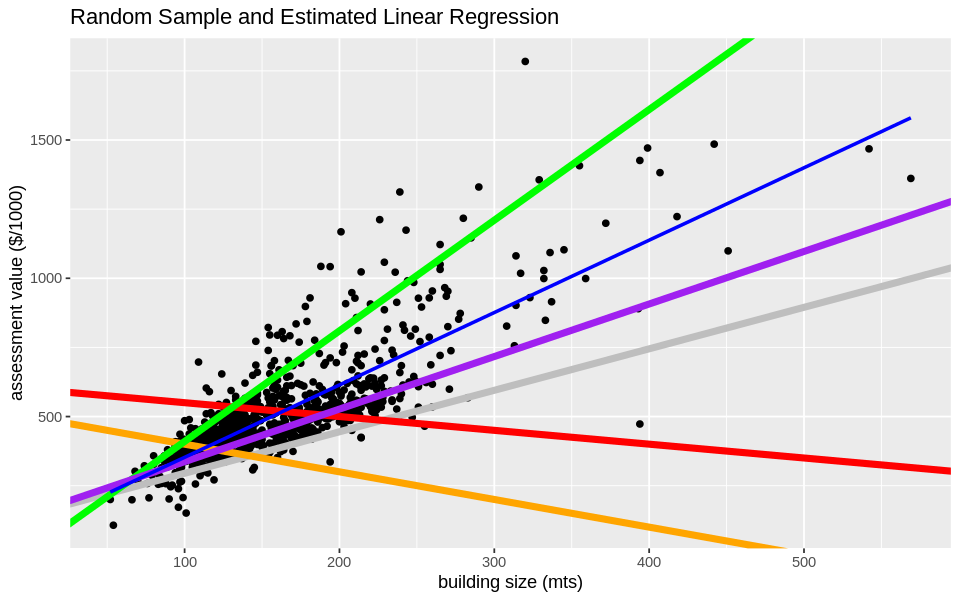

In [3]:
plot_value

### Which one is the best line?? 

#### Least Squares method minimizes the sum of the squares of the residuals!!

> **Note** the residuals are the distances of each point to the estimated line

#### Check [this application](http://setosa.io/ev/ordinary-least-squares-regression/)

<center>
<img src="https://github.com/UBC-STAT/stat-301/blob/master/supplementary-material/img/LS_ISL.png?raw=true" style="width:800px"/>
</center>
From An Introduction to Statistical Learning, by James, Witten, Hastie and Tibshirani 

## 1. LS in R

In [4]:
lm_s <- lm(assess_val~BLDG_METRE,data=dat_s)
tidy(lm_s)%>%mutate_if(is.numeric, round, 3)

term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),90.769,9.793,9.268,0
BLDG_METRE,2.618,0.059,44.514,0


The formula in `lm` has the response variable before the `~` and the predictors after. In this case we have only one predictor (`BLDG_METRE`). 

> `lm(assess_val~.,data=dat_s)` uses all variables in the dataset, except the response, as predictors 

## 2. Visualization of the LS line

Population points in grey and sample points in black

In [5]:
plot_value <- dat %>% ggplot(aes(BLDG_METRE, assess_val)) + 
  geom_point(color = "grey") +
  xlab("building size (mts)") + 
  ylab("assessed value ($/1000)") +
  geom_point(data = dat_s, aes(BLDG_METRE, assess_val), color = "black") +
  geom_smooth(method = lm, se = FALSE, color = "blue") +
  ggtitle("Random Sample and Estimated Linear Regression")


`geom_smooth()` using formula = 'y ~ x'


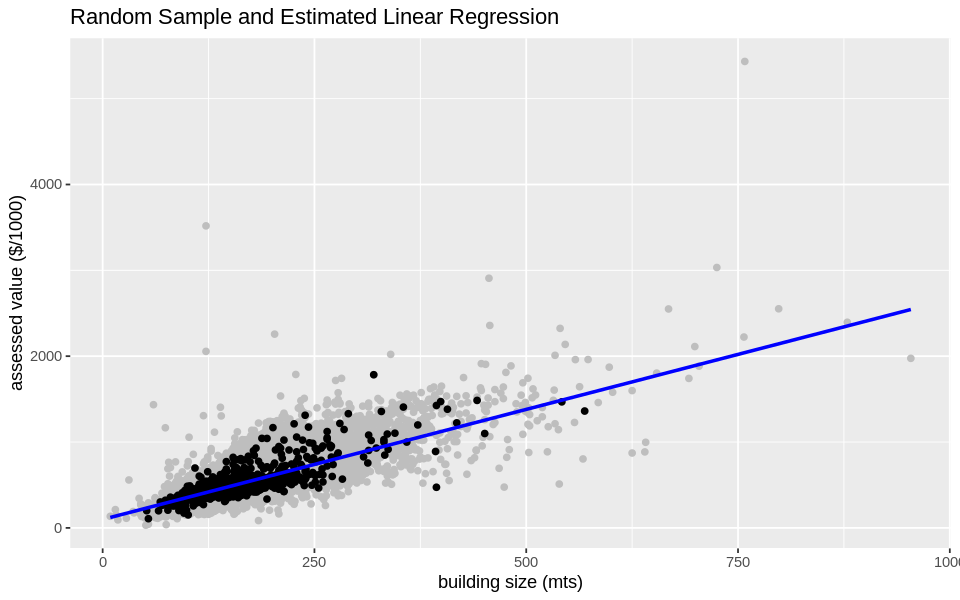

In [6]:
plot_value

## 3. The estimated slope

The estimated slope: $\hat{\beta}_1=2.6$ measures the relationship between the assessment value and the size of a property


#### Interpretation:

- **Correct**: An increase of 1 metre in size *is associated* with an increase of $2618 in the assessment value!


- **Wrong**: *The effect* of 1 meter increase in the size of a property is a $2618 increase in the assessment value 


- **Wrong**: A 1 meter increase in the size of a property *caused* a $2618 increase in the assessed value 


<font color="red"> Important:</font> We don't know if the change in size *caused* the change in value and we can't isolate the *effect* of size (*holding other factors fixed*) from all other factors in observational data 

## 4. The estimated intercept

The estimated intercept: $\hat{\beta}_0=90.8$ measures the expected assessment value for a property of size 0 mts. 

- We are not usually interested in this parameter

- We can't even think of it as the value of the land, it's really an interpolated value of our model

- Note that if the predictor is centered, $X_{i}-\bar{X}$, then the intercept represents the value of a property of average size.


<font color="red"> Important: </font> Many statistical properties do not hold for models without intercept!

### Parameter *vs* Estimator *vs* Estimate 


#### 3 important different concepts:  

| **Course** | **Population Parameter** | **Estimator** | **Estimate** |
| -------------------------------| ------------------------------- | ------------------------------- | ----------------------- |
|  | unknown quantity| function of the random sample: *random variable*| real number computed with data (non-random) |
| STAT 201 | mean = $E[Y]$| sample mean = $\bar{Y}$| 499 |
| STAT 301 | slope = $\beta_1$| estimator of the slope = $\hat{\beta}_1 = \frac{\sum_{i=1}^n(X_i-\bar{X})(Y_i-\bar{Y})}{\sum_{i=1}^n(X_i-\bar{X})^2}$ | 2.6 |


> **Note**: we use a "hat" over the coefficient to distinguish the estimator from the true coefficient

> **Note**: usually $\hat{\beta}_0$ and $\hat{\beta}_1$ are used for both the estimates and the estimators, which can be confusing

# Summary and Conclusions

- Linear Regression Models provide a unifying framework to  <font color=blue> estimate  and  test </font> the true relation between different type of variables and a **continuous response**

- Linear Regression Models can also be used to <font color=blue> predict </font> the value of a **continuous response** (although it may not be the best predictive model)

- We assume that the conditional expectation of the response is linearly related to the input variable and the line is the *linear regression*</font>

- Least Squares is one method to estimate the coefficients of a regression: it minimizes the sum of squares of the residuals

- LS regression can be computed in R using the `lm` function

- Using data from observational studies, we can not study any cause or effect between variables, only associations.